In [3]:
%pylab inline
import os
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

if True:
    figMsDir='/work/xiangchong.li/work/massMapSparse/sim/plot/'
    datDir='work/xiangchong.li/work/S16ACatalogs/'
else:
    figMsDir='/home/xiangchong/.local/code/massMap_Private/doc/paper_ms_method_HSCY1/'
    datDir='/home/xiangchong/work/gw_ipmu/work/S16ACatalogs/'

Populating the interactive namespace from numpy and matplotlib


In [1]:
cd wrkDir/sim

/work/xiangchong.li/work/massMapSparse/sim


In [291]:
zlmin   = 0.04
deltazl = 0.045
nzl     = 10
zlmax=zlmin+deltazl*(nzl+0.1)
zlbound=np.arange(zlmin,zlmax,deltazl)

x=np.arange(-48,48)
y=np.arange(-48,48)
z=(zlbound[:-1]+zlbound[1:])/2.
Z,Y,X=np.meshgrid(z,y,x,indexing='ij')

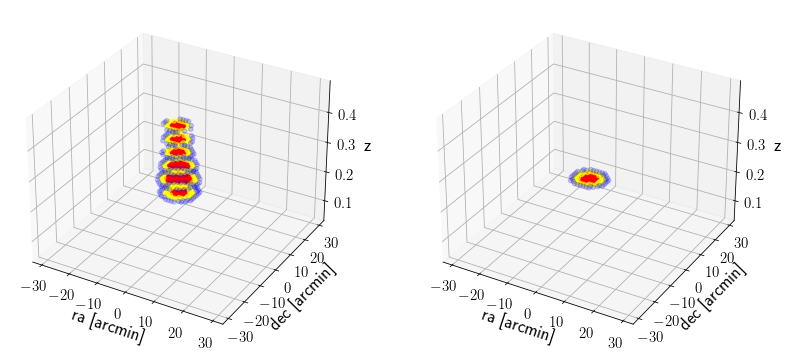

In [296]:
plt.close()
fig = plt.figure(figsize=(12,5))

fname='planck-cosmo/pre-run/pix96-ns10/nl10/deltaR-3-7-zt-nn-lasso.fits'
data=pyfits.getdata(fname)
mask=np.abs(data.flatten())>1e-2
ubound=np.percentile(data.flatten()[mask],np.linspace(70,100,3))
lbound=np.percentile(data.flatten()[mask],np.linspace(70,100,3)-10)


ax = fig.add_subplot(1,2,1, projection='3d')
mask2=(data>lbound[-1])&(data<=ubound[-1])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='red',alpha=1.)
mask2=(data>lbound[-2])&(data<=ubound[-2])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='yellow',alpha=.6)
mask2=(data>lbound[-3])&(data<=ubound[-3])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='blue',alpha=.2)
ax.set_xlim(-32,32)
ax.set_ylim(-32,32)
ax.set_zlim(zlmin,zlmax)

ax.set_xlabel('ra [arcmin]')
ax.set_ylabel('dec [arcmin]')
ax.set_zlabel('z')


fname='planck-cosmo/pre-run/pix96-ns10/nl10/deltaR-3-7-zt-nn-alasso.fits'
data=pyfits.getdata(fname)
mask=np.abs(data.flatten())>1e-2
ubound=np.percentile(data.flatten()[mask],np.linspace(70,100,4))

ax = fig.add_subplot(1,2,2, projection='3d')
mask2=(data>ubound[-2])&(data<=ubound[-1])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='red',alpha=1.)
mask2=(data>ubound[-3])&(data<=ubound[-2])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='yellow',alpha=.6)
mask2=(data>ubound[-4])&(data<=ubound[-3])
ax.scatter3D(X[mask2], Y[mask2], Z[mask2], color='blue',alpha=0.2)
ax.set_xlim(-32,32)
ax.set_ylim(-32,32)
ax.set_zlim(zlmin,zlmax)
ax.set_xlabel('ra [arcmin]')
ax.set_ylabel('dec [arcmin]')
ax.set_zlabel('z')
plt.tight_layout()

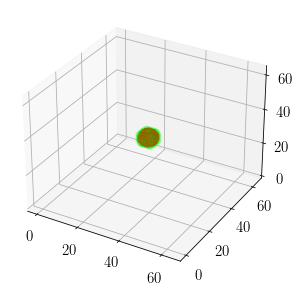

In [287]:
plt.close()
fig = plt.figure(figsize=(5,5))

x=np.arange(-32,32)
y=np.arange(-32,32)
z=np.arange(-32,32)
Z,Y,X=np.meshgrid(z,y,x,indexing='ij')
ax = fig.add_subplot(1,1,1, projection='3d')
mask2=(X**2.+Y**2.+Z**2.)<16
im=ax.voxels(mask2, color=[1, 0, 0, 1.])
mask2=((X**2.+Y**2.+Z**2.)<25)&((X**2.+Y**2.+Z**2.)>16)
im=ax.woxels(mask2, color=[0, 1, 0, 0.1])
